# Mask R-CNN for Floorplan Layout Detection and Segmentation (Schools)

#### This tutorial has the code and instructions for: 
- Floor-plan dataset & annotation tool (Section 1).
- Model training (Section 2).
- Testing and evaluating the floorplan-mrcnn model (Sections 3-5).
 
#### Dependecies: 

- The code is implemented using Python 3, Keras, and TensorFlow. ResNet101 is used as a backbone network. 
    - <font color='blue'> All dependecies should be installed for the code to run correctly (dependecies are included in the requirements.txt).</font>


#### Output:
- The model generates bounding boxes and segmentation masks for 11 different floorplan layout elements including: Bathroom, Bathroom Stall, Door (Flat), Door (Curve), Door (Revolving), Door (Double), Door (Extending), Entrance, Lift, Meeting Room, and Stairs

#### In this tutorial, we will provide visualisations to test, analyse and evaluate the floorplan-mrcnn trained model.

## 1. Floorplan Dataset 

The School Floorplan dataset was curated by collecting and processes various School Floorplans from several Image Engines  

### 1.1 Data Annotation

##### Annotation tool:
- [VGG Image Annotator (VIA)](https://www.robots.ox.ac.uk/~vgg/software/via/) tool is used for annotation. VIA is an open source project based solely on HTML, Javascript and CSS (no dependency on external libraries). 
- The tool runs in a web browser and does not require any installation or setup.
- [via.html](https://www.robots.ox.ac.uk/~vgg/software/via/via.html) : online copy of VIA 2.0.11 application

##### Floor-plan annotation:
- Polygons, rectangles and circles are manually annotated for the 11 layout elements in each of the 119 school floorplan images.
- We used VIA tool to generate one single JSON file with the training set annotations and another JSON file for the annotations of the validation set. 

In [1]:
import sys
sys.path.append('../scripts/')
sys.path.append('../')
import os

from inspect_model import *

dataset_dir = '../dataset/school_floor_plans/Schools/'

weights_1 = "../models/school_models/mask_rcnn_floorplan_i6_final_1.h5"
weights_2 = "../models/school_models/mask_rcnn_floorplan_i6_final_2.h5"
weights_3 = "../models/school_models/mask_rcnn_floorplan_i6_final_3.h5"


weights_path = weights_1

Instructions for updating:
non-resource variables are not supported in the long term


Using TensorFlow backend.


### 1.2 Load Floorplan Dataset
In this section, we run the code to load school training or validation subsets and some information about the loaded subset. 

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np 
import random
import glob
import sys
%matplotlib inline 

save_path = '../output/fp_mrcnn/'
if not os.path.exists(save_path):
    os.makedirs(save_path)
    
config = get_config(confidence=0.7, config="School")
dataset = load_dataset(subset="test", FLOORPLAN_DIR=dataset_dir, config=config)

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Images: 18
Classes: ['BG', 'Bathroom', 'Bathroom Stall', 'Door (Curve)', 'Door (Double)', 'Door (Extending)', 'Door (Flat)', 'Stairs']
Image Count: 18
Class Count: 8
  0. BG                                                
  1. Bathroom                                          
  2. Bathroom Stall                                    
  3. Door (Curve)                                      
  4. Door (Double)                                     
  5. Door (Extending)                                  
  6. Door (Flat)                                       
  7. Stairs                                            


### 1.3 Display Sample Annotated Image
In this section, we visualise sample image with the corresponding annotations from the dataset loaded in the previous section. 
- image_id refers to the index of the image that will be displayed (0 $\le$ image_id $\lt$ image_count). For example, if image_count is 6, then image_id can be 0,1,2,3,4, or 5.

image id: 5 and number of annotated objects: 57
image                    shape: (1303, 2000, 3)       min:    0.00000  max:  255.00000  uint8


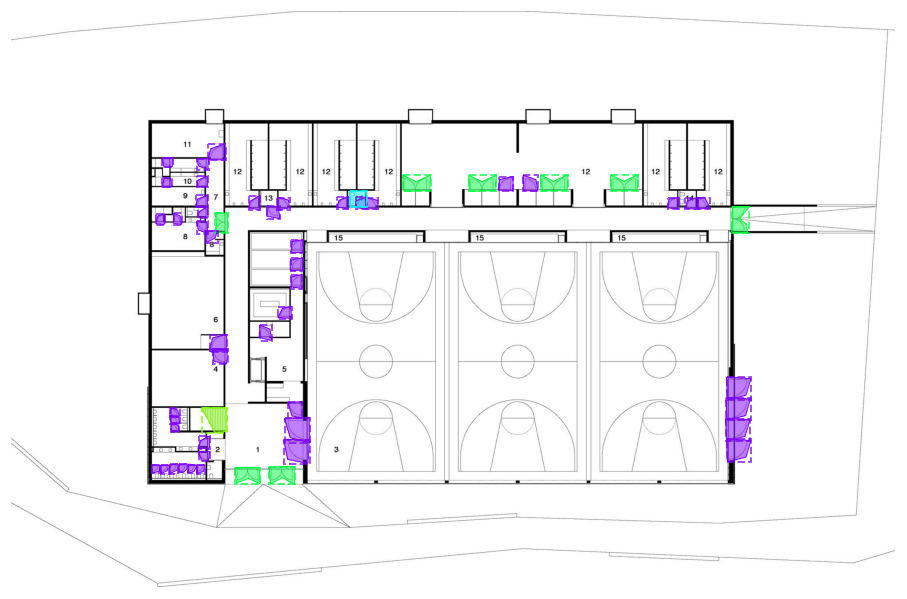

In [3]:
spath = save_path + 'schools_test_set/gt/'
if not os.path.exists(spath):
    os.makedirs(spath) 
image_id = 5
im_gt = visualize_annotations(image_id=image_id, dataset=dataset, save_path=spath)


## 2. Model Training

Two training stages were performed to generate the final floorplan-mrcnn model:
- In the first stage, we repeatedly used the COCO pretrained weights to train a baseline model 
- In the second training stage, based on the performance of the baseline model, we tweaked the configuration to train the model on All layers in the network, with a target image size of 2048px/2048px (width/height), and 150 epochs.

Floorplan-mrcnn trained model can be downloaded from [here](https://drive.google.com/file/d/130j5PHPQ-8MbBXDDvA-XblhfhAL_dVuT/view?usp=sharing)


### 2.1 Load Trained Model
In this section, we load the trained model to be used for testing and evaluation. 
Please ignore any warning messages that might be printed when executing this section.

In [4]:
model = load_model(config=config, weights_path=weights_path)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.
Loading weights: mask_rcnn_floorplan_i6_final_1.h5 







## 3. Model Performance using the Test Set (with annotations)

### 3.1 Qualitative Results:

In this section we use the validation dataset and the trained floorplan-mrcnn model to visualise predictions for sample image from the validation set.
- We use the same image_id that is used to display the ground truth image in section 1.3.  
- The visualised image will be saved in the predictions folder

image ID: floorplan.sch_using_124.jpg 


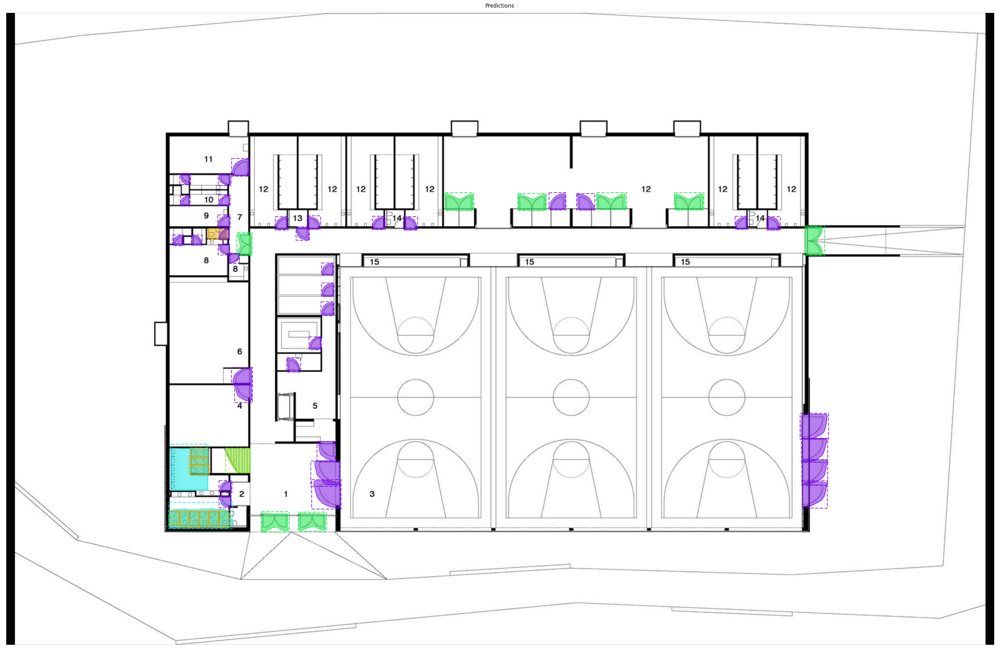

In [5]:

im_pred = run_detection(im_id=image_id, config=config, model=model, dataset=dataset, save_path=None, show_mask=True)

Showing the ground truth image and the prediction image side by side

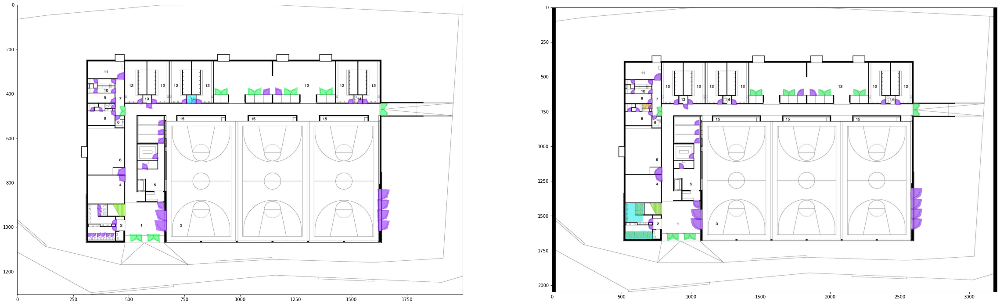

In [6]:
fig = plt.figure(figsize = (40,60))
plt.subplot(1,2,1)
plt.imshow(im_gt)
plt.subplot(1,2,2)
plt.imshow(im_pred)
plt.show()

### 3.2 Quantitative Results: 

##### Performance metrics:

1.  IoU is used to classify whether the detected bounding box is a true positive or a false positive by measuring the overlap between the predicted boundary and the the ground truth bounding box. If the overlap between the two boundaries is greater than a predefined threshold, then the predicted bounding box is correct (i.e. true positive). 

<img src="../input/school_floorplan_detection/iou_example.png" width="200" height="100">

2.  AP (average precision) is used to measure the accuracy of the trained model. Average precision computes the average precision value for recall value over 0 to 1. Precision-recall:
    - Precision: the proportion of positive identifications that is actually correct
        - Formula: TP/(TP + FP)

    - Recall: the proportion of actual positives that is identified correctly
        - Formula: TP/(TP + FN)

3. Accuracy: TP/(TP + FP + FN)
    

##### Floorplan evaluation metrics:
For each image in the validation set, we report 
- The number of ground truth objects
- The number of correct matches (TP) @IoU=0.3: objects in both ground truth and predictions
- The number of incorrect matches (FN) @IoU=0.3: objects in the prediction but not in the ground truth
- The number of missing matches (FP) @IoU=0.3: objects in the ground truth but not in the prediction
- The average precision
- The accuracy


In [8]:
iou_threshold = 0.3
APs, df = compute_batch_ap(dataset.image_ids, config=config, model=model,dataset = dataset,iou_threshold=iou_threshold)
print("mAP @ IoU={}: {}".format(iou_threshold*100, np.round(np.mean(APs),3)))
print("mAcc @ IoU={}: {}".format(iou_threshold*100, np.round(df['CorrectMatches-TP'].sum()/(df['CorrectMatches-TP'].sum()+df['IncorrectMatches-FN'].sum()+df['MissingMatches-FP'].sum()),3)))

df

mAP @ IoU=30.0: 0.695
mAcc @ IoU=30.0: 0.599


,Name,Width,Height,GT_Count,CorrectMatches-TP,IncorrectMatches-FN,MissingMatches-FP,AP,Accuracy
0,sch_using_59.jpg,1666,2300,48,28,23,20,0.484,0.394
1,sch_using_22.jpg,1930,1560,75,67,5,8,0.854,0.838
2,sch_using_80.jpg,1400,1400,93,43,7,50,0.452,0.430
3,sch_using_112.jpg,2019,1693,25,25,1,0,0.982,0.962
4,sch_using_62.jpg,1918,1078,184,63,15,121,0.310,0.317
5,sch_using_124.jpg,2000,1303,57,45,12,12,0.668,0.652
6,sch_using_123.jpg,1200,800,41,35,7,6,0.823,0.729
7,sch_using_119.jpg,2280,1417,56,44,15,12,0.760,0.620
8,sch_using_8.jpg,770,434,16,11,4,5,0.603,0.550
9,sch_using_48.jpg,2612,1924,41,36,2,5,0.871,0.837


## 4. Model Performance using Test Set from Deakin University (no annotations)

The test set used in this section consists of 7 images taken from Deakin D and BA Buildings with no available annotations. This means that the model performance can be evauated visually only. 


image ID: Burwood - BA - L01 - Architectural.jpg 


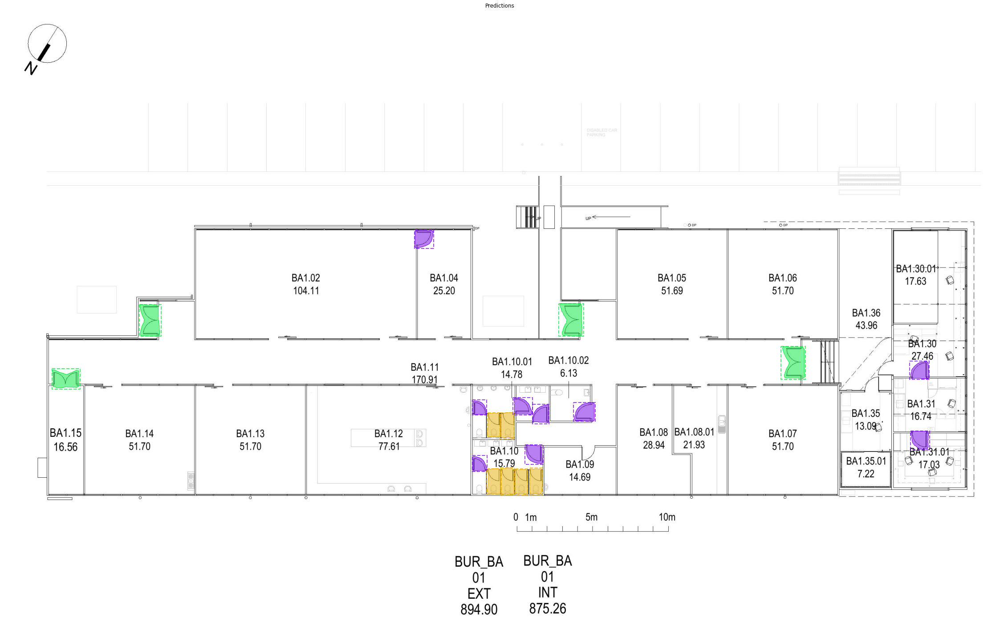

image ID: Burwood - D - L05 - Architectural.jpg 


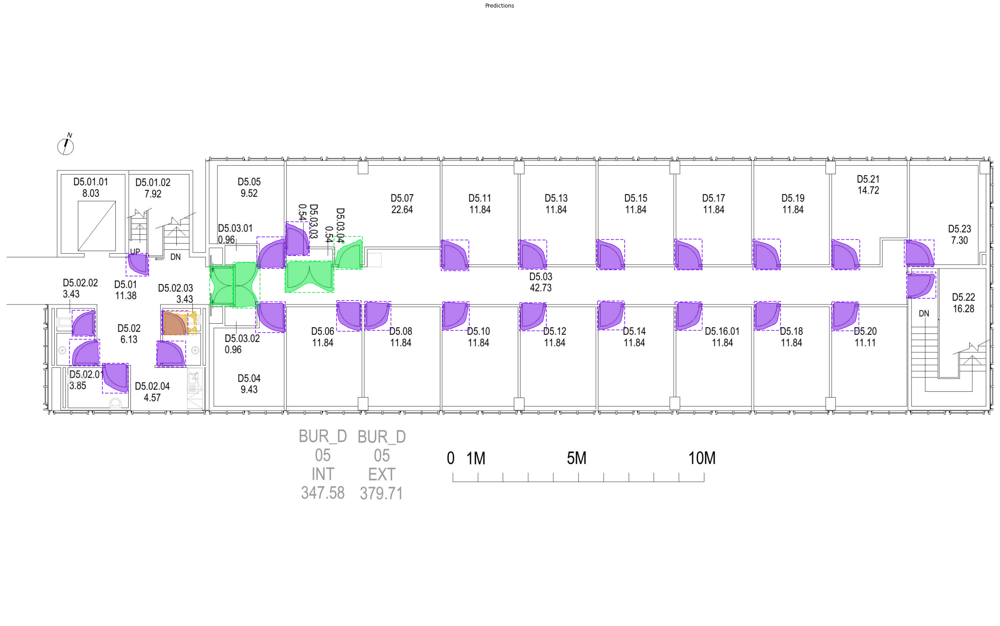

image ID: Burwood - D - L04 - Architectural.jpg 


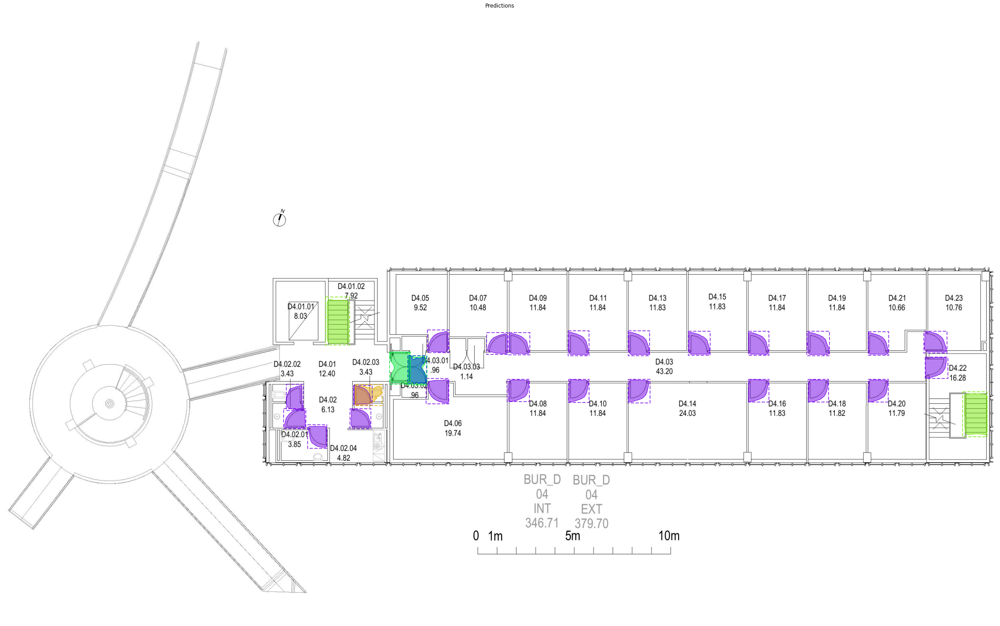

image ID: Burwood - D - L06 - Architectural.jpg 


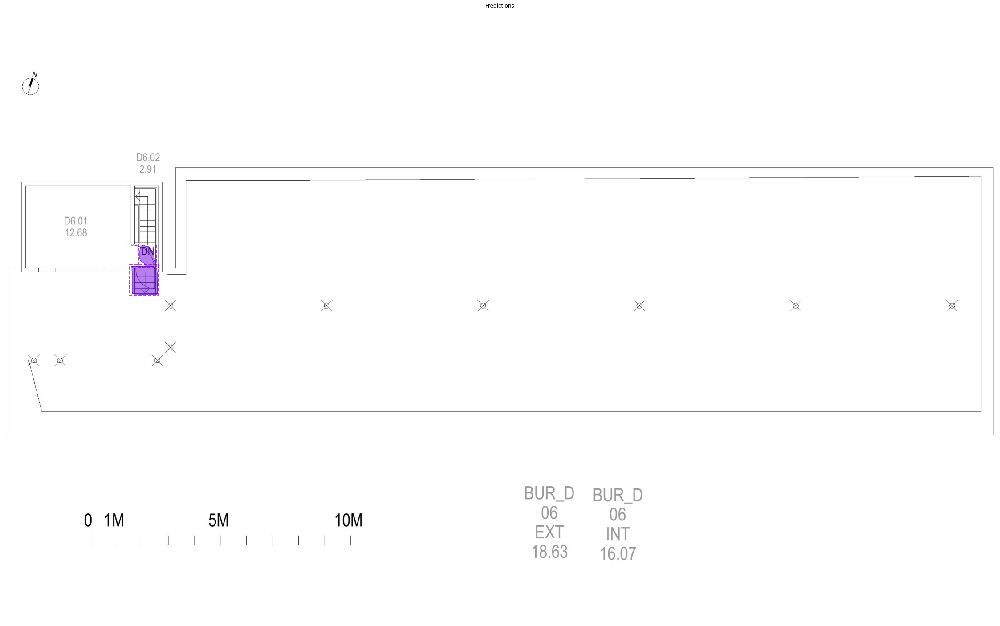

image ID: Burwood - D - L01 - Architectural.jpg 


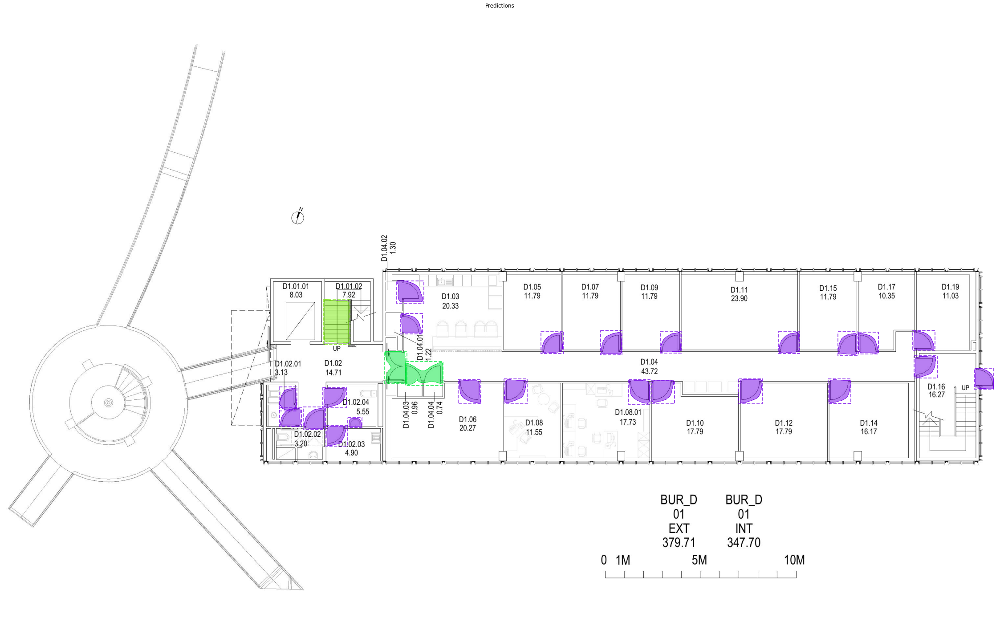

image ID: Burwood - D - L02 - Architectural.jpg 


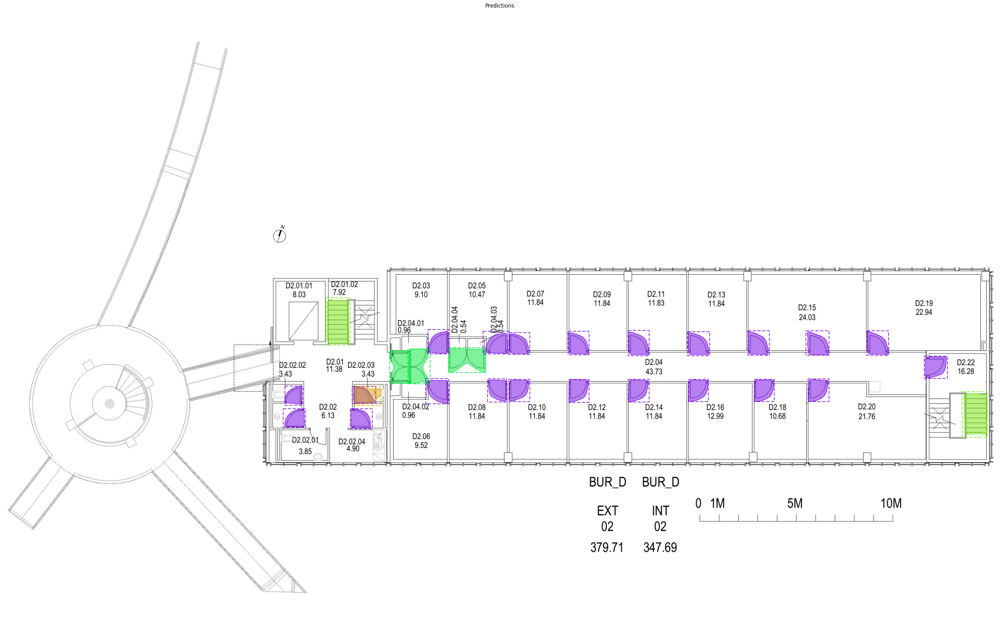

image ID: Burwood - D - L03 - Architectural.jpg 


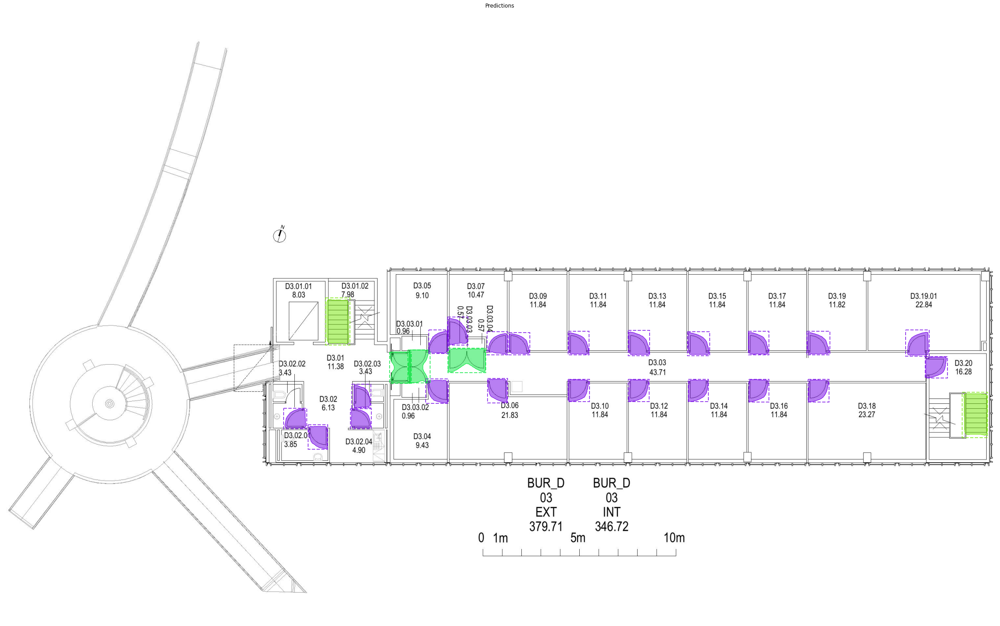

In [9]:
im_dir = '../dataset/deakin_bc_floor_plans/test_deakin/'
for im_path in glob.glob(im_dir+'*'):
    
    _ = run(im_path=im_path, model=model, dataset=dataset, save_path=save_path, show_mask=True)
    plt.show()

## 5. Model Performance using Test Set from the Internet: No Annotations

- In this section, we visualise the predictions for 6 images randomly collected from the internet with no ground truth. 

image ID: im6.jpg 


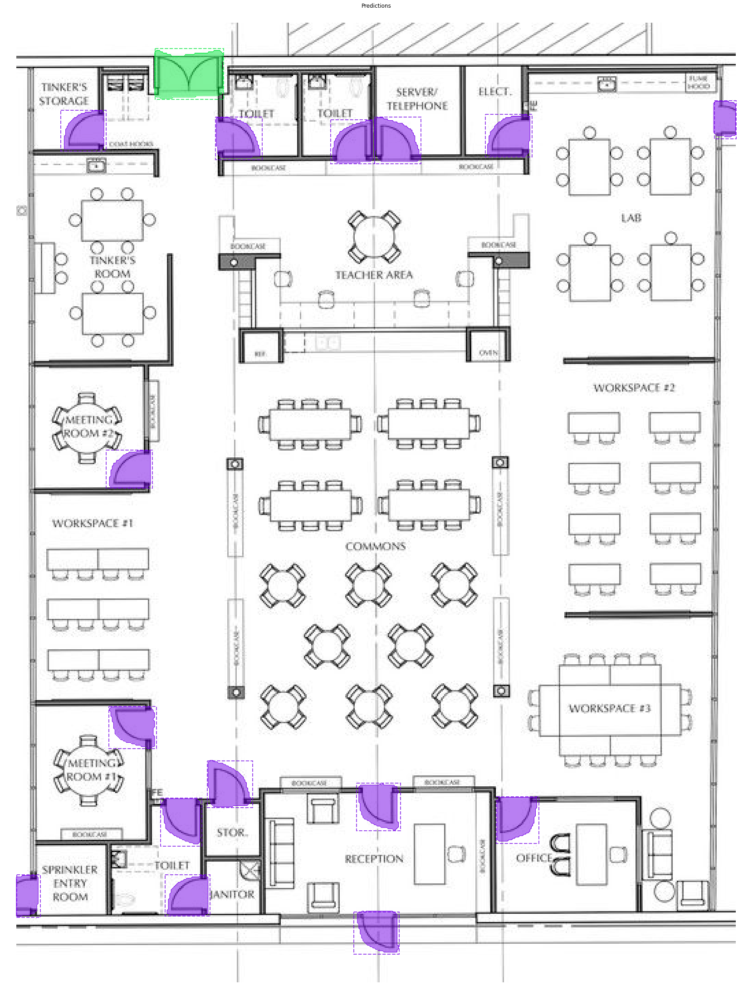

image ID: im4.jpg 


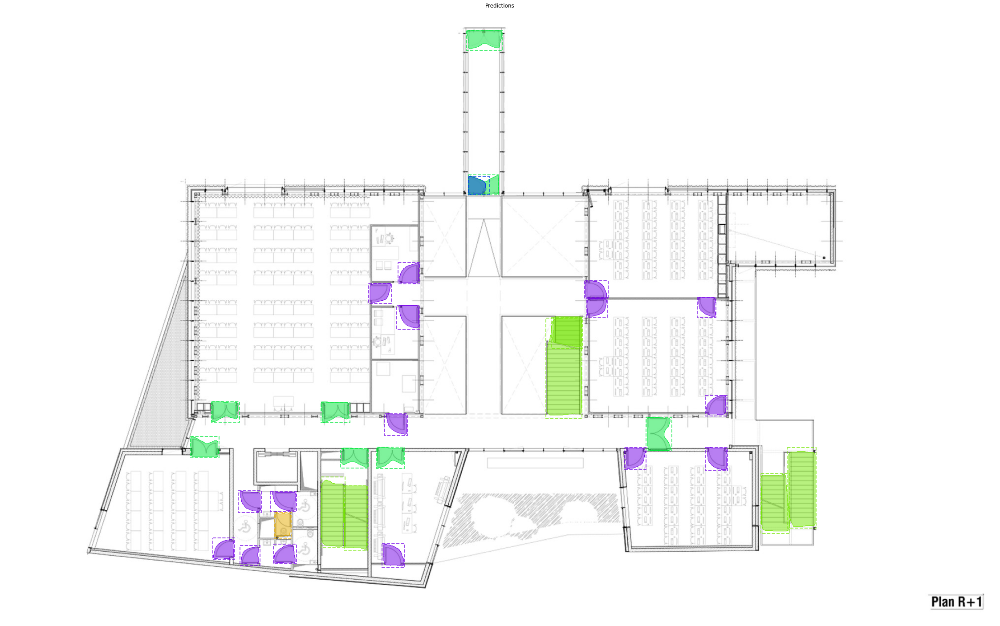

image ID: im5.jpg 


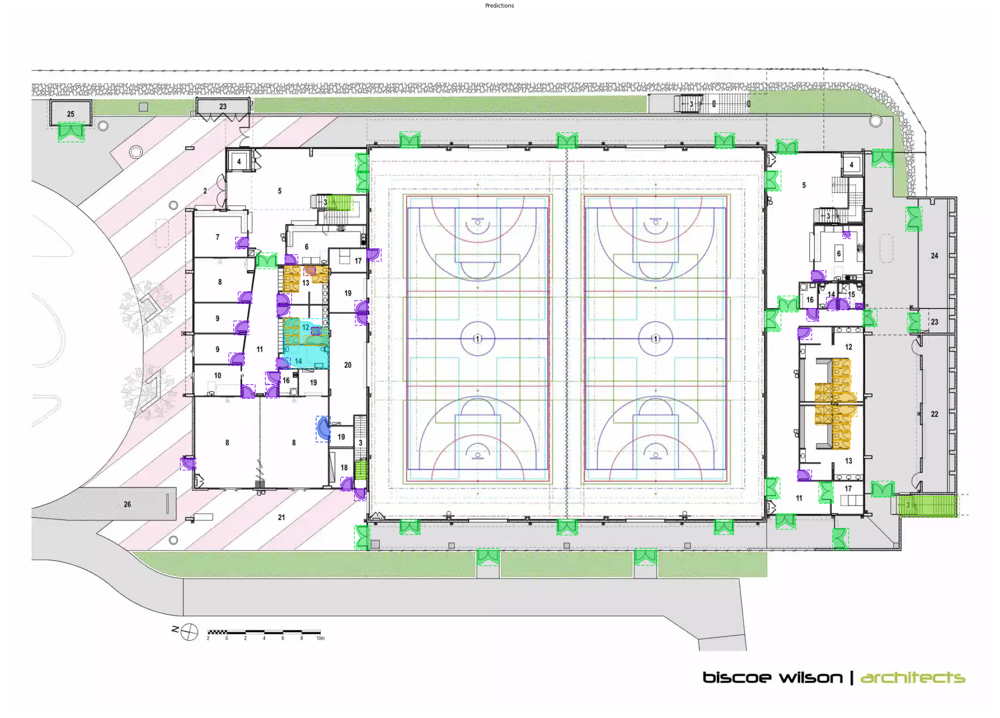

image ID: im1.jpg 


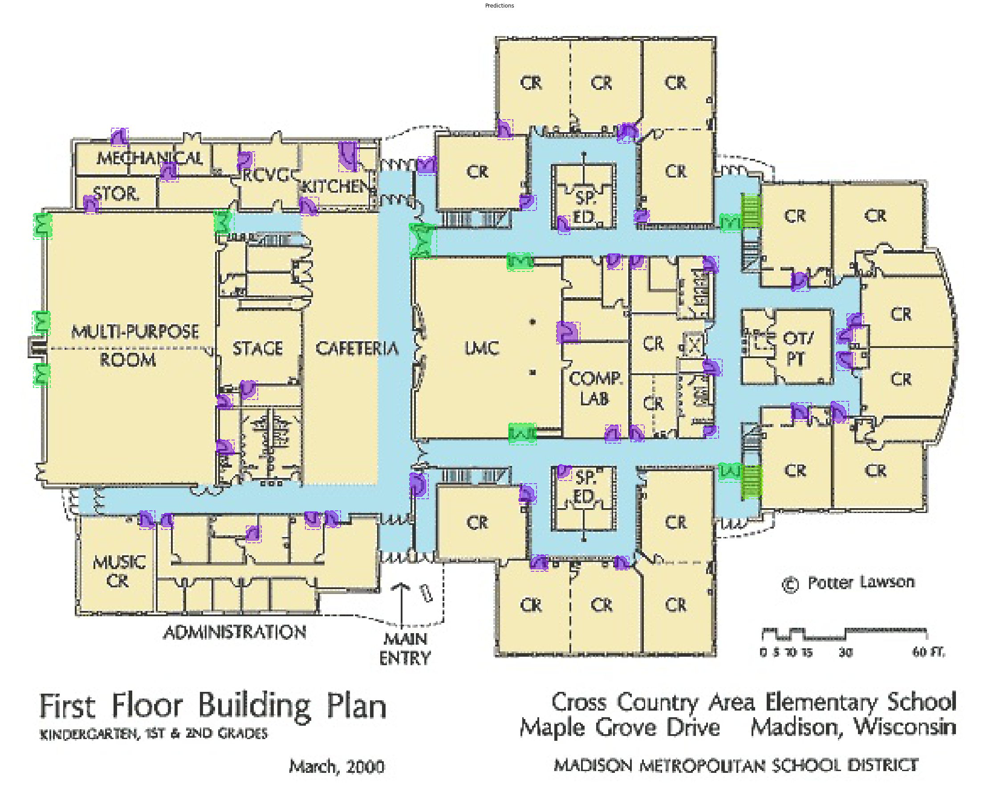

image ID: im2.jpg 


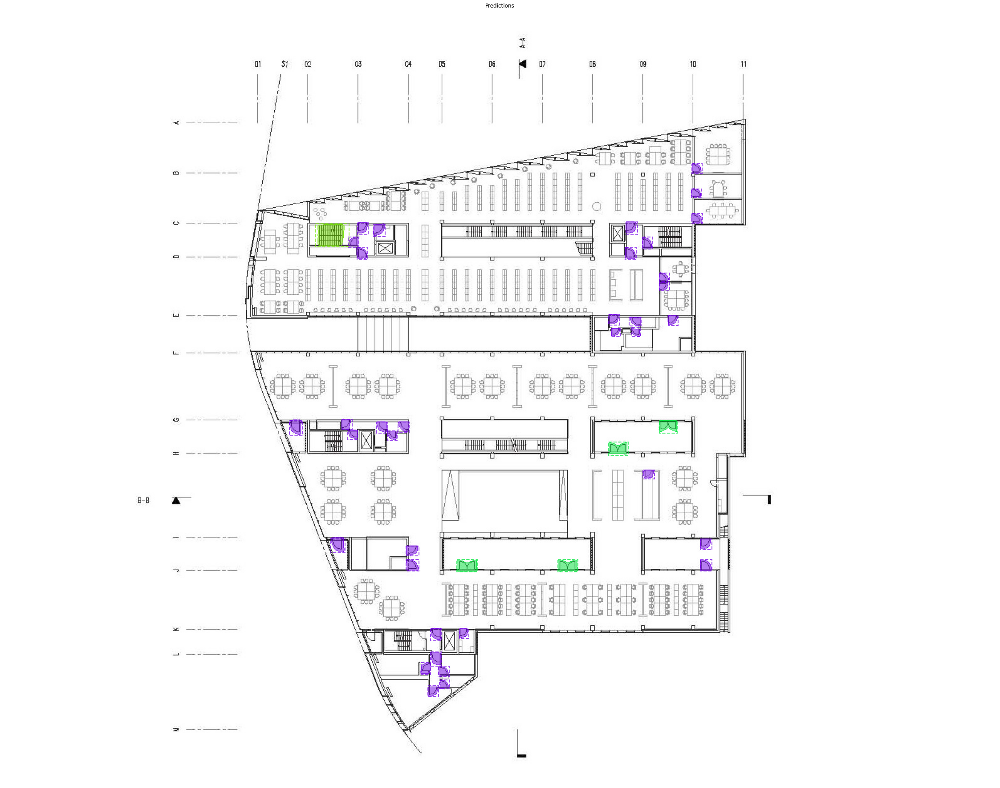

image ID: im3.jpg 


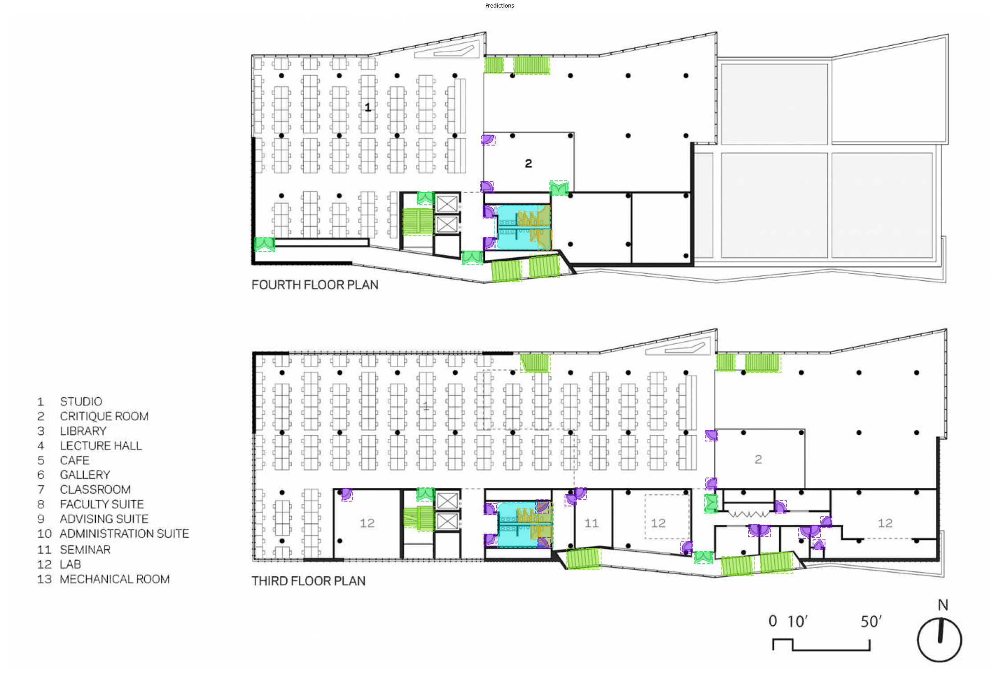

In [10]:
im_dir = '../dataset/deakin_bc_floor_plans/test_other/'
for im_path in glob.glob(im_dir+'*'):
    _ = run(im_path=im_path, model=model, dataset=dataset, save_path=save_path, show_mask=True)
    plt.show()

#### Test your own floor-plan image

- im_path has the path for the test image

image ID: im5.jpg 


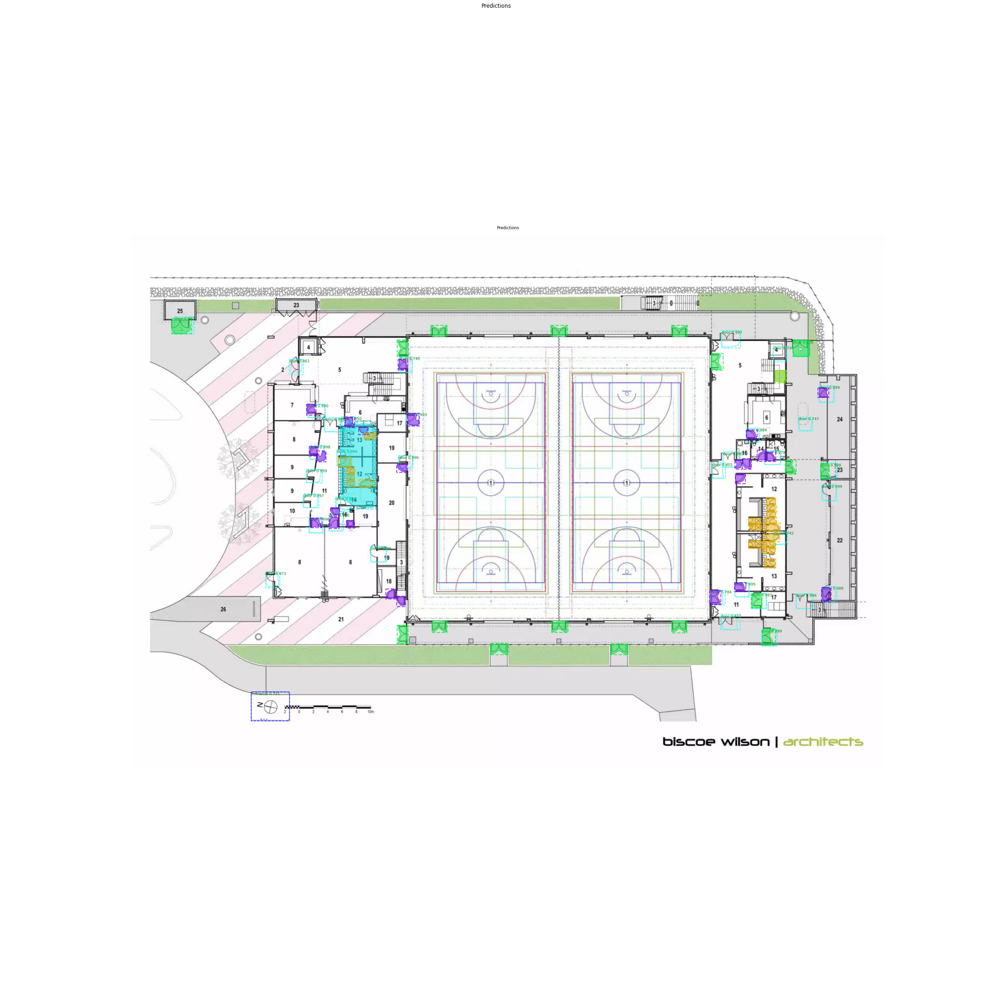

In [14]:
im_path = '../input/im5.jpg'
_ = run(im_path=im_path, model=model, dataset=dataset, save_path=save_path, show_mask=True)

## 6. Fusion model perfromance evaluation

In [ ]:
res_im_path = '../input/im5.jpg'

image = skimage.io.imread(res_im_path)
# If grayscale. Convert to RGB for consistency.
if image.ndim != 3:
    image = skimage.color.gray2rgb(image)
# If has an alpha channel, remove it for consistency
if image.shape[-1] == 4:
    image = image[..., :3]

model_1 = load_model(config=config, weights_path=weights_1)
model_2 = load_model(config=config, weights_path=weights_2)
model_3 = load_model(config=config, weights_path=weights_3)

models = np.array([model_1, model_2, model_3])
cf_iou_threshold = 0.5

fused_results = get_fusion_results(image, models=models, iou_threshold=cf_iou_threshold, fusing_operation="AND")

class_ids = fused_results.get_class_ids()
boxes = fused_results.get_boxes()
masks = fused_results.get_masks()
scores = fused_results.get_scores()

    
"""
Generate random colour scheme for each Class
"""
class_names_arr = dataset.class_names
colours = random_colors(len(dataset.class_names), bright=False, shuffle=False)
colours = [colours[x - 1] for x in class_ids]

"""
Display detections over the above image
"""
res = display_instances(image, boxes, masks, class_ids, class_names_arr, scores, colors=colours)

        

Loading weights: mask_rcnn_floorplan_i6_final_1.h5 
Loading weights: mask_rcnn_floorplan_i6_final_2.h5 
Loading weights: mask_rcnn_floorplan_i6_final_3.h5 
Detections Size: Before - 103, After - 62
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Fusing Op: AND
Optimal Detections Size: 62
